<font size= 20> network

In [1]:
import xarray as xr
import cartopy
import cartopy.crs as ccrs
import numpy as np
import timeit
import matplotlib as mpl
import cartopy.feature as cfeature
import matplotlib.pylab as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.offsetbox import AnchoredText
import matplotlib.cm as cm
from scipy.interpolate import CloughTocher2DInterpolator, LinearNDInterpolator, NearestNDInterpolator
import glob
import matplotlib.colors as colors
import intake
import dask
from scipy.spatial import cKDTree
import networkx as nx
import psyplot.project as psy
import pandas as pd
from scipy.stats import pearsonr
from pandas.plotting import lag_plot
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.stattools import adfuller, kpss, grangercausalitytests
import warnings
from statsmodels.tsa.stattools import grangercausalitytests
import scipy.stats
from scipy import stats

dask.config.set({"array.slicing.split_large_chunks": True}) 

In [2]:
eerie_cat=intake.open_catalog("https://raw.githubusercontent.com/eerie-project/intake_catalogues/main/eerie.yaml")
eerie_cat["dkrz.disk.model-output.icon-esm-er.eerie-control-1950.atmos.gr025"]

gr025:
  args:
    path: https://raw.githubusercontent.com/eerie-project/intake_catalogues/main/dkrz/disk/model-output/icon-esm-er/eerie-control-1950/atmos/gr025/main.yaml
  description: This catalog contains atmospheric EERIE ICON-ESM-ER eerie-control-1950
    output on 0.25deg grid available at DKRZ disk.
  driver: intake.catalog.local.YAMLFileCatalog
  metadata:
    catalog_dir: https://raw.githubusercontent.com/eerie-project/intake_catalogues/main/dkrz/disk/model-output/icon-esm-er/eerie-control-1950/atmos


In [3]:
eerie_dkrz=eerie_cat["dkrz"]

In [4]:
eerie_dkrz_disk=eerie_dkrz["disk"]
#for col in eerie_dkrz_disk:
#    print(f"Description of {col}:")
#    print(eerie_dkrz_disk[col].describe()["description"])

In [5]:
cat=eerie_dkrz_disk["model-output"]["icon-esm-er"]

In [6]:
searchdict=dict(
    model="ICON",
    realm="atmos",
    exp="eerie-control-1950",
    var="pr",
    frequency="daily"
)
subcat=cat
for v in searchdict.values():
    subcat=subcat.search(v)
list(subcat)

['eerie-control-1950.atmos.gr025.2d_daily_max',
 'eerie-control-1950.atmos.gr025.2d_daily_mean',
 'eerie-control-1950.atmos.gr025.2d_daily_min',
 'eerie-control-1950.atmos.gr025.plev19_daily_mean',
 'eerie-control-1950.atmos.native.2d_daily_max',
 'eerie-control-1950.atmos.native.2d_daily_mean',
 'eerie-control-1950.atmos.native.2d_daily_min',
 'eerie-control-1950.atmos.native.model-level_daily_mean_1',
 'eerie-control-1950.atmos.native.model-level_daily_mean_2',
 'eerie-control-1950.atmos.native.plev19_daily_mean']

In [7]:
#EKE
ds=cat["eerie-control-1950.ocean.gr025.2d_daily_mean"].to_dask()
ds

<xarray.Dataset>
Dimensions:                              (time: 13695, lat: 721, lon: 1440,
                                          lev: 1, depth: 1)
Coordinates:
  * depth                                (depth) float64 1.0
  * lat                                  (lat) float64 -90.0 -89.75 ... 90.0
  * lev                                  (lev) float64 0.0
  * lon                                  (lon) float64 0.0 0.25 ... 359.5 359.8
  * time                                 (time) datetime64[ns] 2002-01-01T23:...
Data variables: (12/30)
    Wind_Speed_10m                       (time, lat, lon) float32 dask.array<chunksize=(32, 721, 1440), meta=np.ndarray>
    atmos_fluxes_FrshFlux_Evaporation    (time, lat, lon) float32 dask.array<chunksize=(32, 721, 1440), meta=np.ndarray>
    atmos_fluxes_FrshFlux_Precipitation  (time, lat, lon) float32 dask.array<chunksize=(32, 721, 1440), meta=np.ndarray>
    atmos_fluxes_FrshFlux_Runoff         (time, lat, lon) float32 dask.array<chunksize=(32, 721, 1440), meta=np.ndarray>
    atmos_fluxes_FrshFlux_SnowFall       (time, lat, lon) float32 dask.array<chunksize=(32, 721, 1440), meta=np.ndarray>
    atmos_fluxes_HeatFlux_Latent         (time, lat, lon) float32 dask.array<chunksize=(32, 721, 1440), meta=np.ndarray>
    ...                                   ...
    so                                   (time, depth, lat, lon) float32 dask.array<chunksize=(32, 1, 721, 1440), meta=np.ndarray>
    ssh                                  (time, lat, lon) float32 dask.array<chunksize=(32, 721, 1440), meta=np.ndarray>
    stretch_c                            (time, lat, lon) float32 dask.array<chunksize=(32, 721, 1440), meta=np.ndarray>
    to                                   (time, depth, lat, lon) float32 dask.array<chunksize=(32, 1, 721, 1440), meta=np.ndarray>
    u                                    (time, depth, lat, lon) float32 dask.array<chunksize=(32, 1, 721, 1440), meta=np.ndarray>
    v                                    (time, depth, lat, lon) float32 dask.array<chunksize=(32, 1, 721, 1440), meta=np.ndarray>
Attributes: (12/31)
    CDI:                       Climate Data Interface version 2.2.4 (https://...
    CDO:                       Climate Data Operators version 2.2.2 (https://...
    Conventions:               CF-1.6
    DOKU_License:              CC BY 4.0
    DOKU_Name:                 EERIE ICON-ESM-ER eerie-control-1950 run
    DOKU_authors:              Putrasahan, D.; Kröger, J.; Wachsmann, F.
    ...                        ...
    simulation_id:             erc1011
    source:                    git@gitlab.dkrz.de:icon/icon-mpim.git@45022778...
    source_id:                 ICON-ESM
    source_type:               AOGCM
    time_reduction:            mean
    title:                     ICON simulation

In [8]:
#frshflux

atm=cat['eerie-control-1950.atmos.gr025.2d_daily_mean'].to_dask()
pr=atm['pr'][:365,:,:].values

In [17]:
atm

<xarray.Dataset>
Dimensions:   (time: 10651, lat: 721, lon: 1440, height: 1, height_2: 1)
Coordinates:
  * height    (height) float64 2.0
  * height_2  (height_2) float64 10.0
  * lat       (lat) float64 -90.0 -89.75 -89.5 -89.25 ... 89.25 89.5 89.75 90.0
  * lon       (lon) float64 0.0 0.25 0.5 0.75 1.0 ... 359.0 359.2 359.5 359.8
  * time      (time) datetime64[ns] 2002-01-01T23:59:00 ... 2031-02-28T23:59:00
Data variables: (12/17)
    clt       (time, lat, lon) float32 dask.array<chunksize=(32, 721, 1440), meta=np.ndarray>
    dew2      (time, height, lat, lon) float32 dask.array<chunksize=(32, 1, 721, 1440), meta=np.ndarray>
    evspsbl   (time, lat, lon) float32 dask.array<chunksize=(32, 721, 1440), meta=np.ndarray>
    hfls      (time, lat, lon) float32 dask.array<chunksize=(32, 721, 1440), meta=np.ndarray>
    hfss      (time, lat, lon) float32 dask.array<chunksize=(32, 721, 1440), meta=np.ndarray>
    pr        (time, lat, lon) float32 dask.array<chunksize=(32, 721, 1440), meta=np.ndarray>
    ...        ...
    rsds      (time, lat, lon) float32 dask.array<chunksize=(32, 721, 1440), meta=np.ndarray>
    rsus      (time, lat, lon) float32 dask.array<chunksize=(32, 721, 1440), meta=np.ndarray>
    sfcwind   (time, height_2, lat, lon) float32 dask.array<chunksize=(32, 1, 721, 1440), meta=np.ndarray>
    tas       (time, height, lat, lon) float32 dask.array<chunksize=(32, 1, 721, 1440), meta=np.ndarray>
    uas       (time, height_2, lat, lon) float32 dask.array<chunksize=(32, 1, 721, 1440), meta=np.ndarray>
    vas       (time, height_2, lat, lon) float32 dask.array<chunksize=(32, 1, 721, 1440), meta=np.ndarray>
Attributes: (12/31)
    CDI:                       Climate Data Interface version 2.2.4 (https://...
    CDO:                       Climate Data Operators version 2.2.2 (https://...
    Conventions:               CF-1.6
    DOKU_License:              CC BY 4.0
    DOKU_Name:                 EERIE ICON-ESM-ER eerie-control-1950 run
    DOKU_authors:              Putrasahan, D.; Kröger, J.; Wachsmann, F.
    ...                        ...
    simulation_id:             erc1011
    source:                    git@gitlab.dkrz.de:icon/icon-mpim.git@45022778...
    source_id:                 ICON-ESM
    source_type:               AOGCM
    time_reduction:            mean
    title:                     ICON simulation

<font size= 20> REGRID

In [18]:
# create regular grid
lon = np.linspace(0, 359.75, 10)
lat = np.linspace(-90, 90, 5)
lon2, lat2 = np.meshgrid(lon, lat)

# reformat coordinates a bit, so scipy function takes it
points_fesom = np.vstack((atm['lon'].values, atm['lat'].values)).T
# load one (the last one, since our dimensions are [time, nod2]) data point
u_data_sample = ds.u[:365,0,:,:]

# create interpolator (based on our points and data). Note, we use `.values` to extract the data from xarray to simple numpy array
nn_interpolation = NearestNDInterpolator(points_fesom, u_data_sample)
# ist interpolated to interpolate to the regular grid created above
interpolated_nn = nn_interpolation((atm['lon'].values, atm['lat'].values))

ValueError: all the input array dimensions for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 1440 and the array at index 1 has size 721

In [8]:

#make the mean
step=1
u_mean=np.mean(ds.u[:365,0,::step,::step], axis=0) #mean across axis=0, ovvero il tempo
v_mean=np.mean(ds.v[:365,0,::step,::step], axis=0)

#calculate eddy velocities
u_eddy=(ds.u[:365,0,::step,::step].values)-(u_mean[:,:].values)
v_eddy=(ds.v[:365,0,::step,::step].values)-(v_mean[:,:].values)

#calculate eke
eke_s=(((u_eddy)**2)+((v_eddy)**2))/2

In [9]:
atm=cat['eerie-control-1950.atmos.gr025.2d_daily_mean'].to_dask()

In [10]:
pr=atm['pr'][:365,:,:].values
#np.save('atmfrshflux2002.npy', frshflux)
pr_s=atm['pr'][:365,::step,::step].values
pr_s.shape

(365, 721, 1440)

In [11]:
from concurrent.futures import ProcessPoolExecutor
n_cpu = 48 #48 is optimal
#max number of CPUs I can use is the number of latitudes we have

In [ ]:
#MORE PARALLELISING


latitudes = ds.lat.values[::step]
longitudes = ds.lon.values[::step]

eke_downsized = eke_s
frshflux_downsized = pr_s

# Get the dimensions of the downsized arrays
num_time_steps, num_latitudes, num_longitudes = eke_downsized.shape



# Set the correlation threshold
correlation_threshold = 0.5
# Define a function for parallelizing the computation of correlation
def correlation_parallel_func(lat_lon):
    lat, lon = lat_lon
    S = nx.Graph()
    if not np.any(np.isnan(eke_downsized[:, lat, lon])):
        # Extract time series at the current 'eke' position
        time_series_eke = eke_downsized[:, lat, lon]

        # Iterate over all positions (lat, lon) for 'frshflux'
        for lat_frshflux in range(num_latitudes):
            for lon_frshflux in range(num_longitudes):
                if not np.any(np.isnan(frshflux_downsized[:, lat_frshflux, lon_frshflux])):
                    # Extract time series at the current 'frshflux' position
                    time_series_frshflux = frshflux_downsized[:, lat_frshflux, lon_frshflux]

                    # Check for NaN values
                    if not (np.any(np.isnan(time_series_eke)) or np.any(np.isnan(time_series_frshflux))):
                        # Calculate Pearson correlation coefficient
                        correlation, _ = pearsonr(time_series_eke, time_series_frshflux)

                        # Check if correlation is above the threshold
                        if abs(correlation) > correlation_threshold:
                            # Add nodes to the graph
                            node_eke = (ds.lat.values[::step][lat], ds.lon.values[::step][lon], 'eke')
                            node_frshflux = (ds.lat.values[::step][lat_frshflux], ds.lon.values[::step][lon_frshflux], 'frshflux')
                            S.add_node(node_eke)
                            S.add_node(node_frshflux)

                            # Add weighted edge with correlation coefficient as weight
                            S.add_weighted_edges_from([(node_eke, node_frshflux, correlation)])
    return S

# Measure the total computation time
start_time_total = timeit.default_timer()

# Use executor.map to parallelize the computation of correlation
with ProcessPoolExecutor(max_workers=n_cpu) as executor:
    S_list = list(executor.map(correlation_parallel_func, [(lat, lon) for lat in range(num_latitudes) for lon in range(num_longitudes)]))

end_time_total = timeit.default_timer()

# Print the total computation time
print(f"Total computation time for the entire script: {end_time_total - start_time_total:.2f} seconds")

# Access individual results
final_S_list = [result for result in S_list]




In [27]:
W=nx.Graph()
for i in range(len(final_S_list)):
    W=nx.compose(W,final_S_list[i])

In [30]:
#SAVE
# Convert node tuples to strings before saving
W_str_labels = nx.relabel_nodes(W, {node: str(node) for node in W.nodes()})

# Save the graph to a GraphML file
nx.write_graphml(W_str_labels, "eke_atmrain_correlation_graph_2002_step8.graphml")

In [28]:
W.number_of_edges()

7799

In [16]:
170 /60

3.8436666666666666

In [26]:
391.10/60

6.5183333333333335

# PLOT

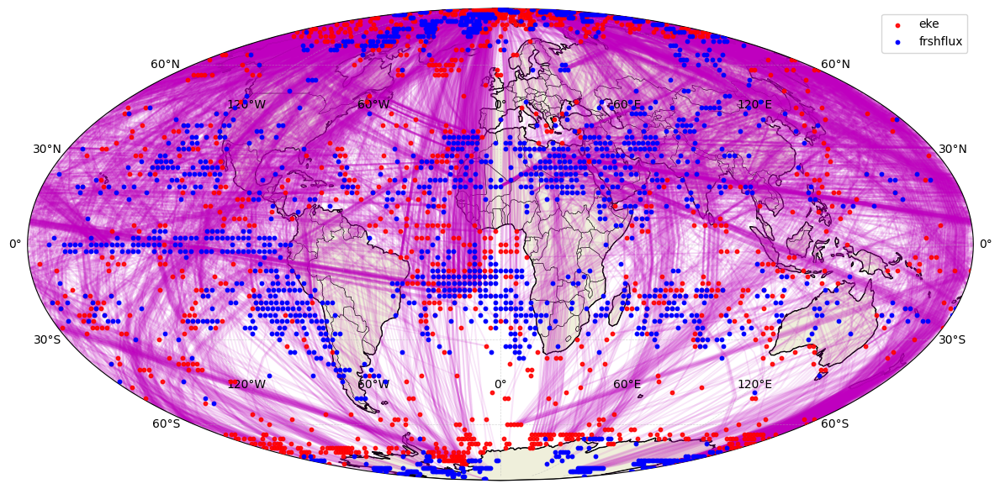

In [31]:
# 

# Generate layout for visualization with Cartopy (changes to long,lat)
pos = {node: (np.mod(node[1], 360), node[0]) for node in W.nodes()} # No need to modify longitudes, assuming they are already in the range -180 to +180

fig, ax = plt.subplots(figsize=(12, 12), subplot_kw={'projection': ccrs.Mollweide()})
# ax.set_global()
# ax.set_extent([-180, 180, -90, 90], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, zorder=1, edgecolor='k')

# Add world map and gridlines
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.gridlines(linewidth=0.5, linestyle='dashed', alpha=0.5, draw_labels=True)

# Extract edge weights for edge width
edge_weights = [data['weight'] for _, _, data in W.edges(data=True)]

# Separate nodes based on type
eke_nodes = [node for node in W.nodes() if node[2] == 'eke']
frshflux_nodes = [node for node in W.nodes() if node[2] == 'frshflux']

#PARTE VECCHIA======================================================================
#for edge, weight in zip(G.edges(), edge_weights):
#    normalized_weight = (weight - min(edge_weights)) / (max(edge_weights) - min(edge_weights))  # Normalize weights between 0 and 1
#    edge_width = 1 + 4 * normalized_weight  # Adjust the multiplier for the desired range of edge widths
#    ax.plot([pos[edge[0]][0], pos[edge[1]][0]],
#            [pos[edge[0]][1], pos[edge[1]][1]], 
#            alpha=0.1, color="m", linewidth=edge_width)

# Plot nodes
#ax.scatter([pos[node][0] for node in eke_nodes], [np.mod(pos[node][1],180) for node in eke_nodes], s=10, color="red", alpha=0.9, label='eke',zorder=20001)
#ax.scatter([pos[node][0] for node in frshflux_nodes], [pos[node][1] for node in frshflux_nodes], s=10, color="blue", alpha=1, label='frshflux',zorder=20001)
#======================================================================



#QUI CONTROLLA CHE COSA SUCCEDE ALLE LOGNITUDINI E LATITUDINI============================================
for edge, weight in zip(W.edges(), edge_weights):
    normalized_weight = (weight - min(edge_weights)) / (max(edge_weights) - min(edge_weights))
    edge_width = 1 + 4 * normalized_weight
    #print("prima",pos[edge[0]][1], pos[edge[1]][1])
    lon1 = (np.mod(pos[edge[0]][1], 180))
    lon2 = (pos[edge[1]][1])

    
    ax.plot([pos[edge[0]][0], pos[edge[1]][0]], [lon1, lon2], alpha=0.1, color="m", linewidth=edge_width, transform=ccrs.PlateCarree())

# Plot nodes
ax.scatter([pos[node][0] for node in eke_nodes], [pos[node][1] for node in eke_nodes], 
           s=10, color="red", alpha=0.9, label='eke', zorder=20001, transform=ccrs.PlateCarree())
ax.scatter([pos[node][0] for node in frshflux_nodes], [pos[node][1] for node in frshflux_nodes],
           s=10, color="blue", alpha=1, label='frshflux', zorder=20001, transform=ccrs.PlateCarree())
#======================================================================






ax.legend()

# Change font color for legend
#font["color"] = "r"


# Resize figure for label readability
ax.margins(0.1, 0.05)
#fig.savefig()
fig.tight_layout()
plt.show()


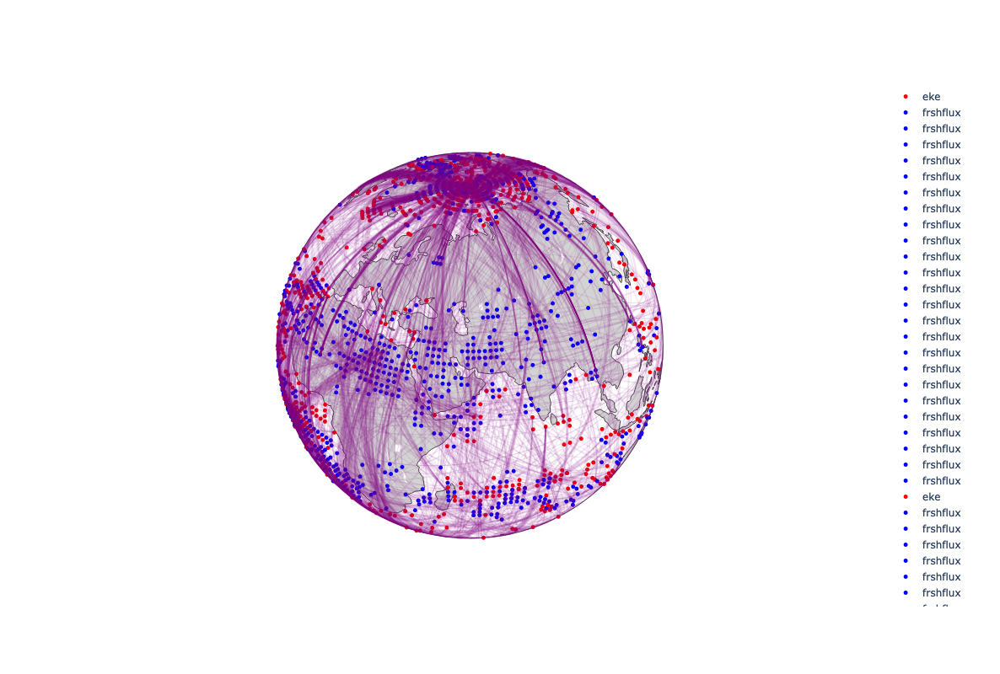

In [32]:
import plotly.graph_objects as go

# Assuming you have a graph G
# G = ...

# Extract edge weights for edge width
edge_weights = [data['weight'] for _, _, data in W.edges(data=True)]

# Separate nodes based on type
eke_nodes = [node for node in W.nodes() if node[2] == 'eke']
frshflux_nodes = [node for node in W.nodes() if node[2] == 'frshflux']

# Create a Plotly graph object
fig = go.Figure()

# Plot nodes
for node in W.nodes():
    fig.add_trace(go.Scattergeo(
        lon=[pos[node][0]],
        lat=[pos[node][1]],
        mode='markers',
        marker=dict(
            size=5,
            color="red" if node[2] == 'eke' else "blue",
        ),
        name=node[2],  # Use the node type as the legend label
        #legendgroup=node[2]  # Assign the same legendgroup to traces with the same label
    ))

# Plot edges
for edge, weight in zip(W.edges(), edge_weights):
    normalized_weight = (weight - min(edge_weights)) / (max(edge_weights) - min(edge_weights))
    edge_width = 1 + 4 * normalized_weight
    fig.add_trace(go.Scattergeo(
        lon=[pos[edge[0]][0], pos[edge[1]][0], None],  # None to create a gap between segments
        lat=[pos[edge[0]][1], pos[edge[1]][1], None],
        mode='lines',
        line=dict(
            width=edge_width,
            color='rgba(128, 0, 128, 0.1)',
        ),
        text=f'Correlation: {weight}',
        hoverinfo='text',
        #legendgroup=node[2]  # Assign the same legendgroup to traces with the same label
    ))
    



# Update layout for better visibility
fig.update_layout(
    geo=dict(
        showland=True,
        landcolor="#D3D3D3",  # Set the color for the land
        projection_type="orthographic"
    ),
    width=1000,  # Set the width of the plot
    height=800   # Set the height of the plot
)


# Save the plot as an HTML file
#fig.write_html("EKEvsRAIN_2002_step10.html")


# ---------------------------------------------------------------------------------------------------------------------------------------------------

In [109]:
# If i wanted only one more step of parallelisation, use:

In [ ]:
#MORE PARALLELISING
def inner_parallel_func(lat_lon):
    lat, lon = lat_lon
    S = nx.Graph()
    if not np.any(np.isnan(eke_downsized[:, lat, lon])):
        # Extract time series at the current 'eke' position
        time_series_eke = eke_downsized[:, lat, lon]

        # Iterate over all positions (lat, lon) for 'frshflux'
        for lat_frshflux in range(num_latitudes):
            for lon_frshflux in range(num_longitudes):
                if not np.any(np.isnan(frshflux_downsized[:, lat_frshflux, lon_frshflux])):
                    # Extract time series at the current 'frshflux' position
                    time_series_frshflux = frshflux_downsized[:, lat_frshflux, lon_frshflux]

                    # Check for NaN values
                    if not (np.any(np.isnan(time_series_eke)) or np.any(np.isnan(time_series_frshflux))):
                        # Calculate Pearson correlation coefficient
                        correlation, _ = pearsonr(time_series_eke, time_series_frshflux)

                        # Check if correlation is above the threshold
                        if abs(correlation) > correlation_threshold:
                            # Add nodes to the graph
                            node_eke = (ds.lat.values[::step][lat], ds.lon.values[::step][lon], 'eke')
                            node_frshflux = (ds.lat.values[::step][lat_frshflux], ds.lon.values[::step][lon_frshflux], 'frshflux')
                            S.add_node(node_eke)
                            S.add_node(node_frshflux)

                            # Add weighted edge with correlation coefficient as weight
                            S.add_weighted_edges_from([(node_eke, node_frshflux, correlation)])
    return S

# Modify parallel_func to use inner_parallel_func
def parallel_func(lat):
    with ProcessPoolExecutor(max_workers=n_cpu) as executor:
        S_list = list(executor.map(inner_parallel_func, [(lat, lon) for lon in range(num_longitudes)]))
    return S_list

# Measure the total computation time
start_time_total = timeit.default_timer()

with ProcessPoolExecutor(max_workers=n_cpu) as executor:
    # Use executor.map to parallelize parallel_func
    results_list = list(executor.map(parallel_func, range(num_latitudes)))

end_time_total = timeit.default_timer()

# Print the total computation time
print(f"Total computation time for the entire script: {end_time_total - start_time_total:.2f} seconds")

# Access individual results
final_S_list = [result for sublist in results_list for result in sublist]

# Continue with the rest of your script...
